In [118]:
'''
Explantion of split_count_select()
Splits a large image into subimages of equal size (have to give it a number of subimages to split into).
For each subimage:
1. Performs Otsu threshold and uses results to determine blocksize and iterations.
2. Performs adaptive thresholding using selected blocksize and iterations. Removes noise.
3. Calculates a score for the result based on scale size variation and uniformity of distribution.
The lower the score, the better.
4. If the score is too high, repeat steps 1-3 on inverted image and see if the score for the inverted
image is lower. Keep the one with lower score.

Finally, choose the 3 subimages with the lowest (best) scores (printed in a list at the bottom as SELECTED SUBIMAGES)

Explantion of run_count_on_directory()
Does the same as split_count_select but does not split images and therefore does not choose best segments.

'''

'\nExplantion of split_count_select()\nSplits a large image into subimages of equal size (have to give it a number of subimages to split into).\nFor each subimage:\n1. Performs Otsu threshold and uses results to determine blocksize and iterations.\n2. Performs adaptive thresholding using selected blocksize and iterations. Removes noise.\n3. Calculates a score for the result based on scale size variation and uniformity of distribution.\nThe lower the score, the better.\n4. If the score is too high, repeat steps 1-3 on inverted image and see if the score for the inverted\nimage is lower. Keep the one with lower score.\n\nFinally, choose the 3 subimages with the lowest (best) scores (printed in a list at the bottom as SELECTED SUBIMAGES)\n\nExplantion of run_count_on_directory()\nDoes the same as split_count_select but does not split images and therefore does not choose best segments.\n\n'

In [119]:
import cv2
import numpy as np
from datascience import *
import matplotlib as mpl
from matplotlib import pyplot as plt
import sys
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 120
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import pandas
import statistics
import image_slicer

#plt.subplots_adjust(left=1, bottom=1, right=1, top=1, wspace=.9, hspace=1)

img_names = []
count_list = []
quality_list = []
image_size_split = []

In [120]:
#perhaps we could make a distribution of distances as well looking at distance between all points

from scipy.spatial.distance import pdist as pdist


#perhaps we can only look at close scales that are of similar size
def dist_dist(c):
    dm = pdist(c, 'euclidean')

def shortest_distance(n, c):
    min_dis = np.inf
    for i in c:
        if (i[0] != n[0] and i[1] != n[1]) and sum((n - i)**2)**.5 < min_dis :
             min_dis = sum((n - i)**2)**.5 
    return min_dis


def avg_shortest_distance(centroids):
    #This goes through and looks at the avg distance between the scales.
    index = 0
    
    shortest_dis = []
    #iterates through every center
    for i in np.arange(0, len(centroids)):
        c = centroids[i]
        #for the given center then compare to all the other c
        shortest_dis.append(shortest_distance(c, centroids))
        
    print("avg shortest distance", np.std(shortest_dis), np.mean(shortest_dis))
    return np.std(shortest_dis), np.mean(shortest_dis)



In [121]:
distance_standard_deviations = []
average_shortest_distances_squared = []

In [122]:
def threshold_otsu(img):
    '''Parameter img should already have been read by cv2 and converted to grayscale.
    Returns sure foreground of image thresholded using Otsu.'''
    # Apply blur
    blur = cv2.GaussianBlur(img,(5,5),1)


    # Threshold image using Otsu
    ret, thresh = cv2.threshold(blur,0 , 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    # Perform opening on thresholded image
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 4)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    ret, sure_fg = cv2.threshold(dist_transform, 1.5, 255, 0)
    
#     plt.imshow(thresh, 'gray')
#     plt.show()
    return sure_fg

In [123]:
def choose_blocksize_and_iterations(img):
    '''Parameter img should be the sure foreground of the Otsu-thresholded image.
    Returns selected blocksize and iterations.'''
    
    # Collect stats from image
    binary_map = (img > 0).astype(np.uint8)
    connectivity = 4 # can be changed
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
   
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    avg_scale_size = np.average(stats[1:,-1])
    
    #added this line of code to find "uniformity"
    distance_std, avg_shortest_dis_squared = avg_shortest_distance(centroids)
    distance_standard_deviations.append(distance_std)
    
    dist_dist(centroids)
    
    average_shortest_distances_squared.append(avg_shortest_dis_squared)
    
    
    print('Block size from formula:', avg_shortest_dis_squared + np.sqrt(avg_scale_size) + int(.214*np.sqrt(avg_scale_size)))
    
    block_size = int(avg_shortest_dis_squared + np.sqrt(avg_scale_size) + int(.214*np.sqrt(avg_scale_size))/2)
    
    iterations = 0 
    
    if block_size % 2 == 0:
        block_size = block_size + 1
    
    if block_size > 85:
        iterations = 3
    else:
        iterations = min(int(block_size/15), 4)
        
    return block_size, iterations


#     if num_labels <= 3:
#         return 15, 1
#     elif avg_scale_size < 350:
#         return 65, 2
#     elif avg_scale_size < 550:
#         return 65, 3
#     else:
#         return 85, 1

In [191]:
def threshold_adaptive(img, blocksize, iterations):
    '''Parameter img should already have been read by cv2 and converted to grayscale.
    Performs adaptive thresholding on img using given blocksize and iterations.
    Returns resulting:
        -sure foreground with noise (for displaying purposes)
        -noise-removed image with scales labeled
        -scale count'''

        
    odd_median_blur_value = int(blocksize/2)
    if odd_median_blur_value %2 == 0:
        odd_median_blur_value = odd_median_blur_value + 1
    
    print(odd_median_blur_value)
    cv2.medianBlur(img, odd_median_blur_value)
    


    if (blocksize > 15):
        #blur = cv2.GaussianBlur(img,(5,5),1)
        blur = cv2.bilateralFilter(img,10,10,200)
        #could make more specific to be distance - scale size 
        #cv2.medianBlur(img, 5)
    
    else:
        blur = cv2.GaussianBlur(img,(2,2),0)

        
    # Collect stats from thresh image

    thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blocksize, -2)
    
#     print('Adaptive Thresholding')
#     plt.imshow(thresh, 'gray')
#     plt.show()
    
    binary_map = (thresh > 0).astype(np.uint8)
    connectivity = 4 # can be changed
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
   
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    scale_sizes = np.copy(stats[1:,-1]) # start from 1 instead of 0 to ignore background, use copy so that stats array doesn't get modified
    scale_sizes.sort() # sort the list of scale sizes from smallest to largest
    avg_scale_size = np.average(scale_sizes[len(scale_sizes) // 2:]) # average size among the largest half of the scales
    

    
    #
    
    thresh2 = cv2.bitwise_not(thresh)
    contour,hier = cv2.findContours(thresh2 ,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contour:
        if cv2.contourArea(cnt) < avg_scale_size/5:
            thresh2 = cv2.drawContours(thresh2, [cnt], -1, (0,0,0), -1)

    thresh = cv2.bitwise_not(thresh2)

#     print('Filling Holes')
#     plt.imshow(thresh, 'gray')
#     plt.show()
    
    #adding

    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = iterations)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    ret, sure_fg = cv2.threshold(dist_transform, 1.5 , 255, 0) 

    # Collect stats from sure_foreground image
    binary_map = (sure_fg > 0).astype(np.uint8)
    connectivity = 4 # can be changed
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
   
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    scale_sizes = np.copy(stats[1:,-1]) # start from 1 instead of 0 to ignore background, use copy so that stats array doesn't get modified
    scale_sizes.sort() # sort the list of scale sizes from smallest to largest
    avg_scale_size = np.average(scale_sizes[len(scale_sizes) // 2:]) # average size among the largest half of the scales
    
    # Remove the identified noise
        # Removing noise
    for i in range(num_labels):
        # If a scale is smaller than 1/10 the average among the largest half of the scales
        if stats[i, cv2.CC_STAT_AREA] < (avg_scale_size / 7):
            noise_left = stats[i, cv2.CC_STAT_LEFT]
            noise_top = stats[i, cv2.CC_STAT_TOP]
            # Go through the bounding box of the noise and find all the pixels that are part of the noise
            for x in range(noise_left, noise_left + stats[i, cv2.CC_STAT_WIDTH]):
                for y in range(noise_top, noise_top + stats[i, cv2.CC_STAT_HEIGHT]):
                    if labels[y][x] == i: # If the pixel is part of the noise
                        labels[y][x] = 0 # Remove the noise by replacing the pixel with the background label
            num_labels -= 1
    # Note: Noise has been removed from labels matrix, but the noise is still in stats/centroids matrices.
    # This is ok because we don't use these outdated stats/centroids matrices again (in later functions, we create updated stats matrices by calling connected components again on the noise-removed image.)
    # Label and count
    # source: https://medium.com/analytics-vidhya/images-processing-segmentation-and-objects-counting-in-an-image-with-python-and-opencv-216cd38aca8e
    label_hue = np.uint8(179 * labels / np.max(labels))
    blank_ch = 255 * np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
    labeled_img[label_hue == 0] = 0

    return sure_fg, blur, labeled_img, num_labels - 1 # background doesn't count as a scale

In [192]:
def overlay(bw_img, color_mask, w1=0.2, w2=0.95):
    a = cv2.cvtColor(bw_img, cv2.COLOR_GRAY2RGB)
    a -= np.min(a)
    a = a/np.max(a)*255
    a = np.clip(a, a_min=0, a_max=255).astype(int)
    b = np.clip(color_mask, a_min=0, a_max=255).astype(int)
    c = cv2.addWeighted(b,w1,a,w2,0)
    return c

In [193]:
def display_results_orig(orig, blurred_img, with_noise, noise_removed, count):

    plt.subplot(1,5,1), plt.imshow(orig, 'gray')
    plt.title("Orginal Grayscale", fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,2), plt.imshow(blurred_img, 'gray')
    plt.title("Blurred Image", fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,3), plt.imshow(with_noise, 'gray')
    plt.title("With Noise", fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,4), plt.imshow(noise_removed, 'gray')
    plt.title("Noise-Removed, Count = " + str(count), fontsize=5)
    plt.tight_layout()

    plt.subplot(1,5,5), plt.imshow(overlay(orig, noise_removed))
    plt.title("Noise-Removed, Count = " + str(count), fontsize=5)
    plt.tight_layout()
    plt.show()
    
def display_results_invert(orig, invert, with_noise, noise_removed, count):
    plt.subplot(1,4,1), plt.imshow(orig, 'gray')
    plt.title("Orginal Grayscale", fontsize=5)
    plt.subplot(1,4,2), plt.imshow(invert, 'gray')
    plt.title("Inverted", fontsize=5)
    plt.subplot(1,4,3), plt.imshow(with_noise, 'gray')
    plt.title("Inverted With Noise", fontsize=5)
    plt.subplot(1,4,4), plt.imshow(noise_removed, 'gray')
    plt.title("Inverted Noise-Removed, Count = " + str(count), fontsize=5)
    plt.show()

In [194]:
def calculate_score(img):
    '''Parameter img should already have scales labeled.
    Calculates and returns score based on average scale size variation and uniformity of scale distribution.
    THE LOWER THE SCORE, THE BETTER.'''
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    binary_map = (img > 0).astype(np.uint8) # make the labeled image binary (make everything that is not black be white)
    
    # we need to collect new data on connected components (rather than using previous stats array) because the noise-removal method in threshold_custom changed the image but not the stats array
    output = cv2.connectedComponentsWithStats(binary_map, 4, cv2.CV_32S)
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    centroids = output[3]
    
    # if there's less than 3 scales (num_labels = num_scales + 1 b/c of background), the checks won't work because standard deviation requires at least 2 points (two distances for distribution function)
    # Result is probably bad if there's zero or 1 scale, but I'm not sure about 2...
    if num_labels <= 3:
        return 100 #this is a random high value I chose to show that the result is not good
    
    size_var = scale_size_variation(num_labels, stats, len(img), len(img[0]))
    dis = distribution(num_labels, centroids)
    
    #Decided not to use overlap/fullness/squareness, but kept them here in comments just in case
    #overlap = overlap_of_bounds(num_labels, stats, len(img), len(img[0])) #bounding box overlap not that useful - maybe only use to eliminate if extremely high, like > 1?
    #fullness, squareness = fullness_and_squareness(num_labels, stats, len(img), len(img[0]))
    
    print("Size variation: " + str(size_var))
    print("Distribution: " + str(dis))
    
    score = (size_var + dis) / 2 # score is the average of size variation and distribution
    print("Overall score: " + str(score))

    return score

    
def bounding_box_edges(i, stats):
    '''Returns coordinates of edges of the bounding box at index i in stats array'''
    left = stats[i, cv2.CC_STAT_LEFT]
    right = left + stats[i, cv2.CC_STAT_WIDTH] - 1
    top = stats[i, cv2.CC_STAT_TOP]
    bottom = top + stats[i, cv2.CC_STAT_HEIGHT] - 1
    return left, right, top, bottom
        
def scale_size_variation(num_labels, stats, img_len, img_width):
    '''Returns average variation in scale size, calculated without edge scales (except in the case where there are not enough non-edge scales).
    High variation likely corresponds to poor quality results.
    Result is considered very good if return value is less than 1.
    Only works if there is at least 2 scales.''' # add assertion error check for this?
    scale_areas = []
    edge_scale_areas = []
    for i in range(1, num_labels): # start at 1 to ignore background
        
        # don't consider scales that touch the edge
        left, right, top, bottom = bounding_box_edges(i, stats)
        if left == 0 or top == 0 or right == img_width - 1 or bottom == img_len - 1:
            edge_scale_areas.append(stats[i, cv2.CC_STAT_AREA].astype(int))
            continue
            
        scale_areas.append(stats[i, cv2.CC_STAT_AREA].astype(int))

    # if 1 or zero non-edge scales, then use edge scales in calculation (otherwise, do not use edge scales)
    if len(scale_areas) < 2:
        scale_areas = scale_areas + edge_scale_areas
        
    stddev = statistics.stdev(scale_areas)
    mean = sum(scale_areas) / len(scale_areas)
    #print("(Std dev / mean) for scale area: " + str(stddev / mean))

    for edge_scale_area in edge_scale_areas: # if any of the edge scales are more than five times the average size of the non-edge scales, this is bad
        if edge_scale_area > 5*mean:
            return 100 # this is bad so return a really high value

    # thresholding good if return value less than 1
    return (stddev / mean) # figure out if dividing by mean makes any sense

def distribution(num_labels, centroids):
    '''Calculates and returns the standard deviation of the distances between the centroids of neighboring scales.
    The lower the return value, the more uniform the distribution of scales.
    Only works if there is at least 3 scales (2 distances to compare)''' # add assertion error check for this?
    x_values = []
    y_values = []
    for i in range(1, num_labels):
        x_values.append(centroids[i, 0])
        y_values.append(centroids[i, 1])
    x_values.sort()
    y_values.sort()
    
    x_diff = []
    y_diff = []
    for i in range(1, len(x_values)):
        x_diff.append(x_values[i] - x_values[i-1]) # differences between neighboring x-coordinates
        y_diff.append(y_values[i] - y_values[i-1]) # differences between neighboring y-coordinates
    
    x_stddev = statistics.stdev(x_diff)
    y_stddev = statistics.stdev(y_diff)
    avg_stddev = (x_stddev + y_stddev) / 2
    return avg_stddev

# ***Currently not used***
# Not used because most images have little overlap of bounds, regardless of how good the thresholding is
def overlap_of_bounds(num_labels, stats, img_len, img_width):
    '''Returns average overlap of the bounding boxes of the scales.
    More overlap suggests that the identified scales are not localized; rather, they weave around one another.
    Result is considered good if return value is less than 0.63.'''
    if num_labels < 2: # return None if no scales
        return
    #check for overlappingness of bounding boxes
    overlap_array = np.zeros((img_len, img_width))
    for i in range(1, num_labels): # start at 1 to ignore background
        left, right, top, bottom = bounding_box_edges(i, stats)
        for r in range(top, bottom + 1):
            for c in range(left, right + 1):
                overlap_array[r, c] += 1
    avg_overlap = np.average(overlap_array)
    #print("Avg bounding box overlap: " + str(avg_overlap))
    percent_overlap = np.count_nonzero(overlap_array > 1) / np.size(overlap_array)
    
    # thresholding good if return value less than 0.63
    return avg_overlap

# ***Currently not used***
# Produces inconsistent results (often wrong)
def fullness_and_squareness(num_labels, stats, img_len, img_width):
    '''Returns average fullness and squareness of the scales.
    Fullness is the ratio of the area of the scale to the area of the bounding box.
    Squareness is the ratio width:length of the bounding box.
    Greater fullness suggests that the scale is solid and full rather than webbed or full of holes.
    Greater squareness suggests that the scale is square/circular rather than long and skinny.
    Results considered good if fullness > 0.7 and squareness > 0.5.'''
    squareness = []
    fullness = []
    for i in range(1, num_labels):
        
        left, right, top, bottom = bounding_box_edges(i, stats)
        # don't consider scales that touch the edge
        if left == 0 or top == 0 or right == img_width - 1 or bottom == img_len - 1:
            continue
            
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        squareness.append(min(w, h) / max(w, h)) # closer to 1 means more square, smaller than 1 means less square
        
        scale_area = stats[i, cv2.CC_STAT_AREA]
        box_area = w * h
        fullness.append(scale_area / box_area)
    if fullness:
        avg_fullness = sum(fullness) / len(fullness)
        #print("Avg fullness: " + str(avg_fullness))
        squareness.sort()
        least_square = squareness[:10]
        avg_squareness = sum(least_square) / len(least_square)
        #print("Avg squareness of 10 least square scales: " + str(avg_squareness))
    
        # thresholding good if fullness > 0.7 and squareness > 0.5
        return avg_fullness, avg_squareness
    else:
        return None, None
    # returns None if no non-edge scales

In [195]:
def compare_results(score_list, num_to_keep):
    '''Compares the scores from different thresholding attempts and returns the indices corresponding to the best one(s).
    The second return value is a boolean indicating whether the best result passes a quality-check.
    Parameters: score_list is a list of scores for each image from calculate_score,
    num_to_keep is the number of images that we want to keep.'''
    
    # Return the indices corresponding to the best results - remember, the lower the score, the better
    best_indices = []
    for i in range(len(score_list)):
        if len(best_indices) < num_to_keep:
            best_indices.append(i)
        else:
            current_worst_score = max([score_list[i] for i in best_indices])
            if score_list[i] < current_worst_score: # if the score is better than the previous scores
                best_indices.remove(score_list.index(current_worst_score)) # remove the index corresponding to lowest score
                best_indices.append(i)
    
    # if any of the selected images have poor quality, say so
    for i in best_indices:
        if score_list[i] > 5: # if the score is too high (change this value later)
            print("Could not find " + str(num_to_keep) + " subimages that pass the quality check.")
        
    return best_indices

In [196]:
def invert(img):
    '''Inverts a grayscale image.'''
    return cv2.bitwise_not(img)

In [197]:
def count_scales(img):
    '''Parameter img must already have been read into cv2 and converted to grayscale.
    Calls threshold_otsu, then choose_blocksize_and_iterations, then threshold_adaptive.
    Returns resulting images and count.'''
    img_otsu = threshold_otsu(img)
    blocksize, iterations = choose_blocksize_and_iterations(img_otsu)
    print("Blocksize, iterations: " + str(blocksize) + ", " + str(iterations))
    with_noise, blurred_img, labeled_img, count = threshold_adaptive(img, blocksize, iterations)
    return with_noise, blurred_img, labeled_img, count

In [198]:
def call_count_scales_and_check_inversion(img):
    '''Main function that calls all the other functions.
    Parameter img should have already been read into cv2.
    Counts scales on original image, checks result, and counts scales on inverted image if needed.
    Finally, compares results from original vs. inverted image, and displays results from the better one.'''
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    print("Original Image:")
    # count scales on original image
    with_noise, blurred_img, labeled_img, count = count_scales(img)
    
    # check how good the results are
    orig_score = calculate_score(labeled_img)
    

    # If the result is good, display results and finish
    if orig_score < 3:
        print("\nOriginal image passed all tests; did not need to check inverted.")
        display_results_orig(img, blurred_img, with_noise, labeled_img, count)
        best_labeled_image = labeled_img
        return count, orig_score, best_labeled_image

    # Otherwise, try inverted image and compare results to original
    else:
        # save the original results in lists for later use
        result_images = [[img, with_noise, labeled_img, count]]
    
        # invert image
        inverted_img = invert(img)
    
        # count scales on inverted image
        print('\nInverted Image:')
        with_noise, inverted_blurred_img, labeled_img, count = count_scales(inverted_img)
    
        # check how good the new results are
        inverted_score = calculate_score(labeled_img)
        score_list = [orig_score, inverted_score]
        
        # compare the results from original and inverted images
        best_index = compare_results(score_list, 1)
        best_index = best_index[0]
    
        
        if best_index == 0:
            print("\nTried both original and inverted, but decided to keep original.")
            best_labeled_image = result_images[0][2]
            display_results_orig(result_images[0][0],  blurred_img, result_images[0][1],best_labeled_image, result_images[0][3])
        elif best_index == 1:
            print("\nDECIDED TO USE INVERTED IMAGE.")
            best_labeled_image = labeled_img
            display_results_invert(img, inverted_img, with_noise, best_labeled_image, count)
        
        return count, score_list[best_index], best_labeled_image

In [199]:
def run_count_on_directory(dirname):
    '''Calls call_count_scales_and_check_inversion function on every image in the given directory.'''
    directory = os.scandir(dirname)
    
    for img in directory:
        if (img.name == '.ipynb_checkpoints' or img.name == '.DS_Store'): # need to figure how to remove these files
            continue
        img_names.append(img.name)
        print(img.name)
        img_arr = cv2.imread(dirname + img.name)
        count, score_list, best_labeled_image = call_count_scales_and_check_inversion(img_arr)

#     table = Table().with_columns("Img Name", img_names, "Number of Scales", count_list, "Passes Quality Check?", quality_list)
#     table.show()
    

In [200]:
def split_count_select(img_path, num_subimages, num_to_keep):
    '''Splits given image into subimages and selects best ones to keep. '''
    img = cv2.imread(img_path)
    img_size = img.shape
    tiles = image_slicer.slice(img_path, num_subimages)
    all_scores = []
    all_counts = []
    all_labeled = []
    i = 0
    for tile in tiles:
        print('SUBIMAGE #' + str(i) + ':\n')
        count, score_list, labeled_image = call_count_scales_and_check_inversion(np.asarray(tile.image))
        all_scores.append(score_list)
        all_counts.append(count)
        all_labeled.append(labeled_image)
        i += 1
    
    best_indices_lst = compare_results(all_scores, num_to_keep)
    
    estimated_total = estimate_total_counts(all_counts, best_indices_lst, num_subimages)
    print('ESTIMATED TOTAL COUNT:', estimated_total, "SCALES")
    print('\n_______________________________________________')
    print('\nSELECTED SUBIMAGES: ' + str(best_indices_lst))
    
    
    for i in np.arange(num_to_keep):
        plt.subplot(1,num_to_keep,i+1), plt.imshow(all_labeled[best_indices_lst[i]], 'gray')
        plt.title("Chosen Image: " + str(best_indices_lst[i]), fontsize=5)
    plt.show()

In [201]:
def estimate_total_counts(all_counts, best_indices, sub_img):
    return (sum([all_counts[i] for i in best_indices]) * sub_img / 3)    
print('here')

here


117716Ventral-NoFlash-3.png
Original Image:
avg shortest distance 18.02941606835778 36.435777674545186
Block size from formula: 55.93902410841821
Blocksize, iterations: 55, 3
27
Size variation: 0.5381912009655186
Distribution: 7.480559586418037
Overall score: 4.009375393691778

Inverted Image:
avg shortest distance 15.471853415714536 50.31973976036852
Block size from formula: 117.11156060112683
Blocksize, iterations: 111, 3
55
Size variation: 100
Distribution: 37.283163845781154
Overall score: 68.64158192289058

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


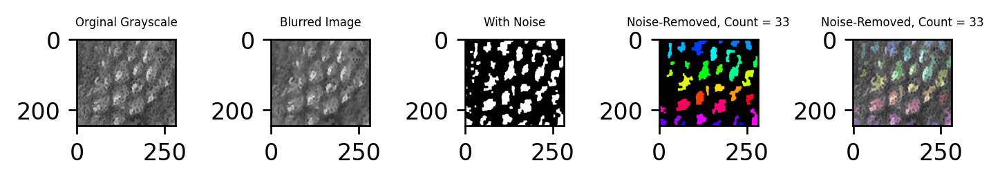

135185Ventral-NoFlash-3.png
Original Image:
avg shortest distance 14.72636009285707 59.93603328117992
Block size from formula: 111.55245137220548
Blocksize, iterations: 107, 3
53
Size variation: 0.32145826884687057
Distribution: 11.201773984129773
Overall score: 5.761616126488321

Inverted Image:
avg shortest distance 62.7433898322383 70.47619133071917
Block size from formula: 179.96191764524167
Blocksize, iterations: 171, 3
85
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


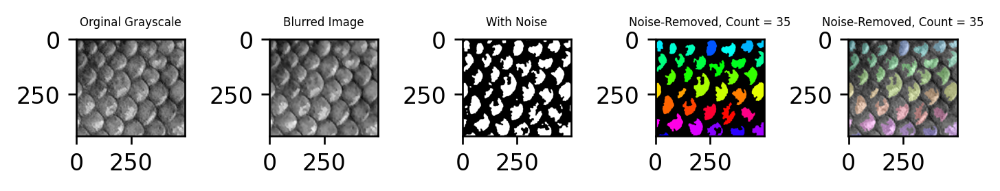

135185Ventral-NoFlash-2.png
Original Image:
avg shortest distance 11.391118838425434 56.74106502943086
Block size from formula: 126.65911057656581
Blocksize, iterations: 121, 3
61
Size variation: 0.3881954408496113
Distribution: 8.445591211390344
Overall score: 4.416893326119977

Inverted Image:
avg shortest distance 20.581194143256187 50.62107967406562
Block size from formula: 84.96274511560239
Blocksize, iterations: 81, 4
41
Size variation: 0.4874516406455134
Distribution: 14.429244965985259
Overall score: 7.458348303315386

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


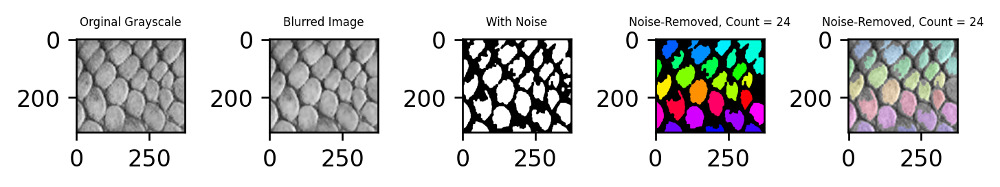

117704Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 3.2000798524115903 21.29061170183345
Block size from formula: 33.957405400264015
Blocksize, iterations: 33, 2
17
Size variation: 0.4793489726828329
Distribution: 2.071461495576234
Overall score: 1.2754052341295334

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


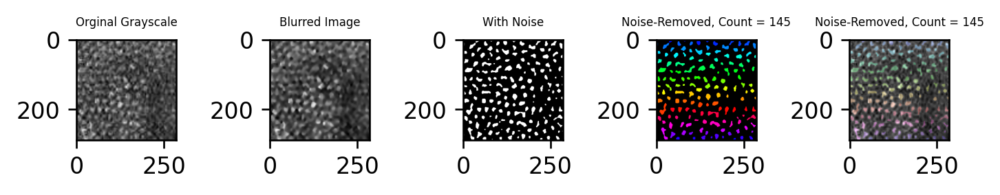

117716Ventral-NoFlash-2.png
Original Image:
avg shortest distance 18.30312828275389 50.87438362518202
Block size from formula: 66.87858467553914
Blocksize, iterations: 65, 4
33
Size variation: 0.6086032745904814
Distribution: 5.909915784351245
Overall score: 3.2592595294708633

Inverted Image:
avg shortest distance 0.0 29.009337981756588
Block size from formula: 497.34209610614863
Blocksize, iterations: 457, 3
229
Size variation: 100
Distribution: 33.108124978554734
Overall score: 66.55406248927737

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


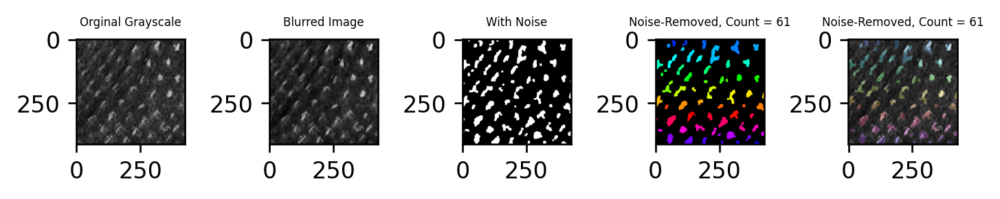

135185Ventral-NoFlash-1.png
Original Image:
avg shortest distance 14.887256154062879 50.338350437640294
Block size from formula: 113.83036663730519
Blocksize, iterations: 109, 3
55
Size variation: 0.3517610963057296
Distribution: 8.386695021884561
Overall score: 4.369228059095145

Inverted Image:
avg shortest distance 15.09616714012448 45.35038968760501
Block size from formula: 77.2943734477984
Blocksize, iterations: 75, 4
37
Size variation: 1.127061346136939
Distribution: 14.072009835895813
Overall score: 7.599535591016376

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


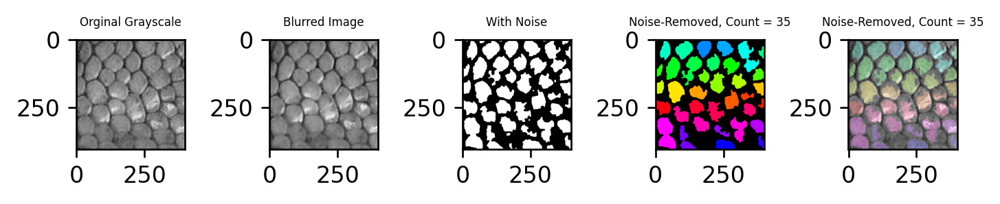

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


117704Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 5.4839751030972925 23.319625349950048
Block size from formula: 40.815930297862025
Blocksize, iterations: 39, 2
19
Size variation: 0.5907947120287975
Distribution: 3.2282351712615385
Overall score: 1.909514941645168

Original image passed all tests; did not need to check inverted.


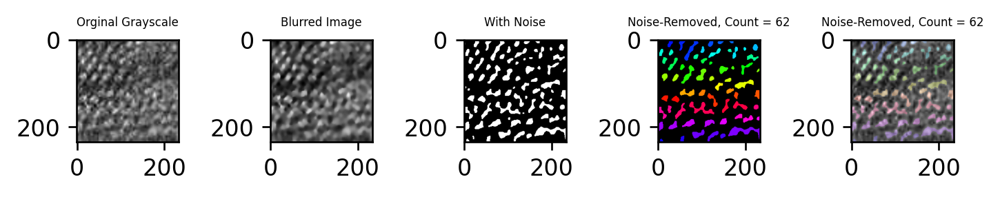

117716Ventral-NoFlash-1.png
Original Image:
avg shortest distance 22.12427120102953 41.92688075880035
Block size from formula: 77.1697064967973
Blocksize, iterations: 75, 4
37
Size variation: 0.7356011379559128
Distribution: 5.61834684828214
Overall score: 3.1769739931190264

Inverted Image:
avg shortest distance 29.66351395351915 45.73090817702016
Block size from formula: 143.37434334916318
Blocksize, iterations: 135, 3
67
Size variation: 100
Distribution: 39.63922138171866
Overall score: 69.81961069085934

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


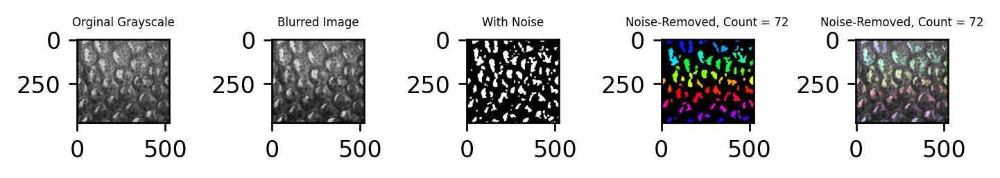

135193Dorsal-NoFlash-3.png
Original Image:
avg shortest distance 8.190158878712738 32.192318396241646
Block size from formula: 49.36246671756404
Blocksize, iterations: 47, 3
23
Size variation: 0.40468699923362944
Distribution: 3.2020595875169473
Overall score: 1.8033732933752884

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


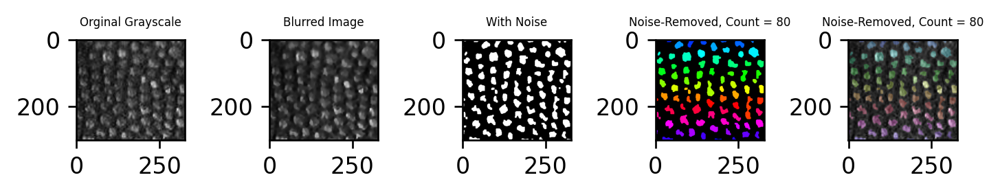

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


117718Dorsal-NoFlash-3.png
Original Image:
avg shortest distance 12.810845656456255 28.992317596832113
Block size from formula: 40.835830020865785
Blocksize, iterations: 39, 2
19
Size variation: 0.5040270969802498
Distribution: 1.998745831253963
Overall score: 1.2513864641171064

Original image passed all tests; did not need to check inverted.


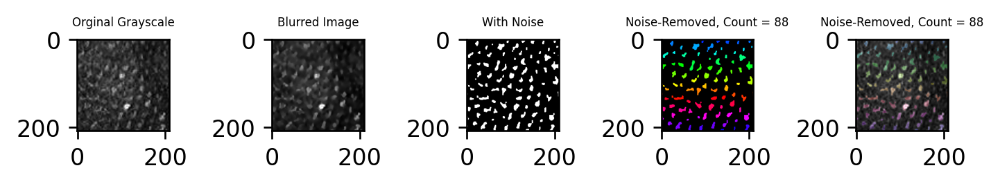

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


117716Ventral-NoFlash-5.png
Original Image:
avg shortest distance 11.0858916530678 28.93880246161428
Block size from formula: 40.391844300091456
Blocksize, iterations: 39, 2
19
Size variation: 0.6176275658680389
Distribution: 3.2431826996203763
Overall score: 1.9304051327442076

Original image passed all tests; did not need to check inverted.


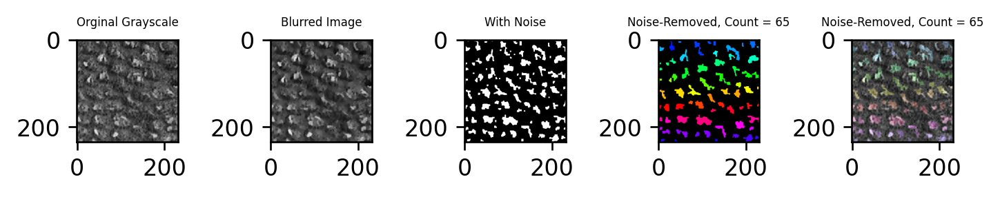

117702Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 11.532464146458492 30.14501751631627
Block size from formula: 57.09306543385833
Blocksize, iterations: 55, 3
27
Size variation: 100
Distribution: 6.482308949732348
Overall score: 53.24115447486617

Inverted Image:
avg shortest distance 9.205930481035187 28.631067147824393
Block size from formula: 57.78525933054911
Blocksize, iterations: 55, 3
27
Size variation: 0.6369275228043078
Distribution: 3.8747612887436844
Overall score: 2.255844405773996

DECIDED TO USE INVERTED IMAGE.


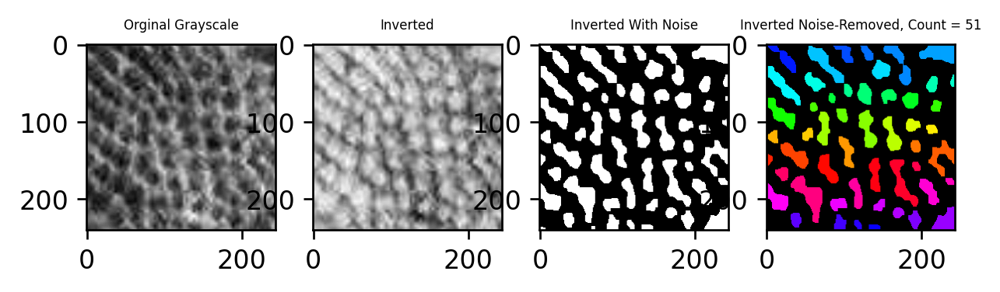

117704Ventral-NoFlash-1.png
Original Image:
avg shortest distance 13.57454219661987 37.3713543380485
Block size from formula: 54.64691620673397
Blocksize, iterations: 53, 3
27
Size variation: 0.7671621959273284
Distribution: 6.111446636746789
Overall score: 3.4393044163370585

Inverted Image:
avg shortest distance 18.095447122992123 36.78822927003787
Block size from formula: 158.32760795653397
Blocksize, iterations: 147, 3
73
Size variation: 100
Distribution: 17.933194381598703
Overall score: 58.96659719079935

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


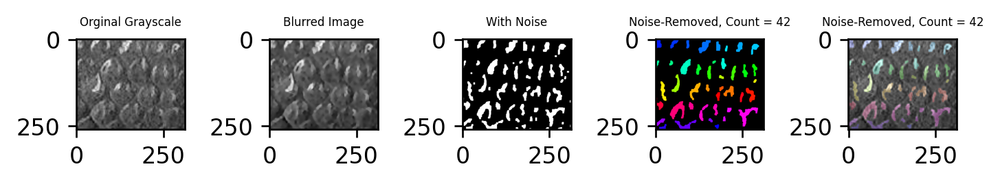

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


117716Ventral-NoFlash-4.png
Original Image:
avg shortest distance 24.7464642911395 41.48287443125554
Block size from formula: 66.93825448692766
Blocksize, iterations: 65, 4
33
Size variation: 0.5461544989547156
Distribution: 5.769983241921233
Overall score: 3.1580688704379742

Inverted Image:
avg shortest distance 17.951187582881445 49.88736640552773
Block size from formula: 131.30027318160438
Blocksize, iterations: 125, 3
63
Size variation: 100
Distribution: 16.800776806543816
Overall score: 58.400388403271904

Tried both original and inverted, but decided to keep original.


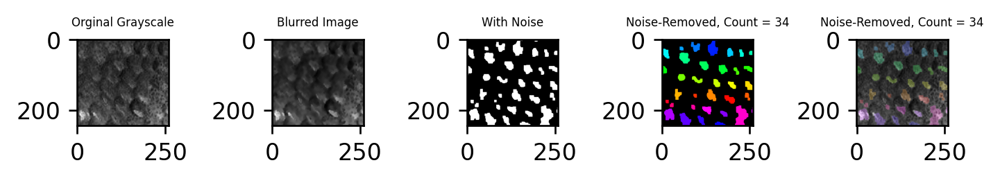

117718Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 4.099749332389358 23.950941027459173
Block size from formula: 39.601948316300536
Blocksize, iterations: 39, 2
19
Size variation: 100
Distribution: 1.818977862154207
Overall score: 50.90948893107711

Inverted Image:
avg shortest distance 8.031116758572862 22.67433231540667
Block size from formula: 53.845745291072646
Blocksize, iterations: 51, 3
25
Size variation: 100
Distribution: 4.54380477059187
Overall score: 52.27190238529594
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


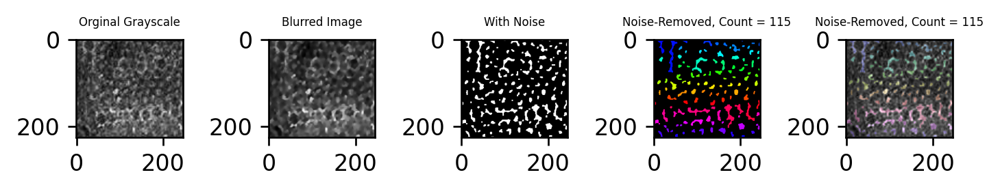

135193Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 6.760856365643391 28.789837460622092
Block size from formula: 46.25334265321425
Blocksize, iterations: 45, 3
23
Size variation: 0.49193452349190014
Distribution: 3.340665077581372
Overall score: 1.916299800536636

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


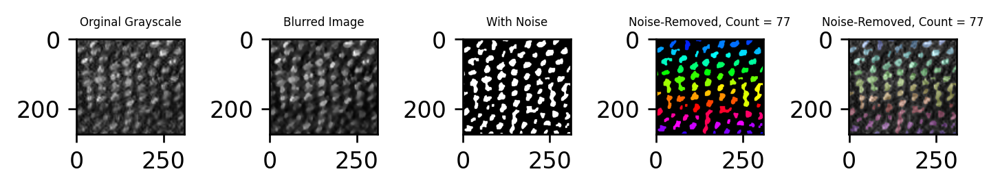

117716Ventral-NoFlash-6.png
Original Image:
avg shortest distance 9.940024279278278 26.229877373314743
Block size from formula: 52.2698410756442
Blocksize, iterations: 51, 3
25
Size variation: 0.62782370263534
Distribution: 4.058205119242102
Overall score: 2.343014410938721

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


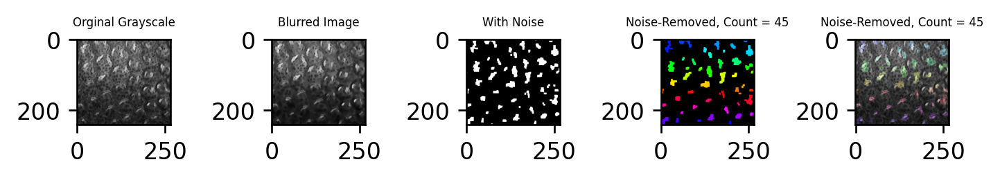

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


117704Ventral-NoFlash-2.png
Original Image:
avg shortest distance 4.9026794054335685 23.71349519046939
Block size from formula: 38.30678344615976
Blocksize, iterations: 37, 2
19
Size variation: 0.40424030379833764
Distribution: 4.3781507768179155
Overall score: 2.3911955403081264

Original image passed all tests; did not need to check inverted.


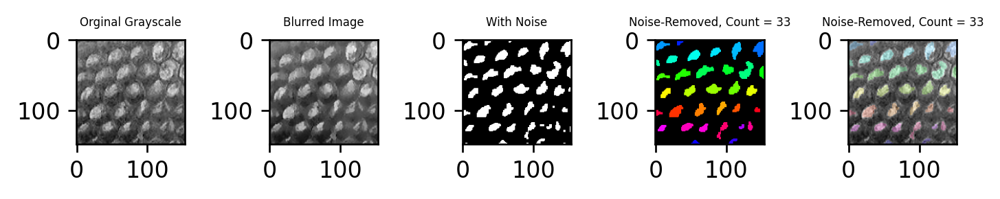

117702Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 13.139595918531812 25.159423655965888
Block size from formula: 43.2936713923238
Blocksize, iterations: 41, 2
21
Size variation: 0.9772586087251166
Distribution: 5.345250853007571
Overall score: 3.161254730866344

Inverted Image:
avg shortest distance 9.793678388348615 27.45978499073967
Block size from formula: 61.92199785227962
Blocksize, iterations: 59, 3
29
Size variation: 0.8064486056050689
Distribution: 6.078698093885867
Overall score: 3.442573349745468

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


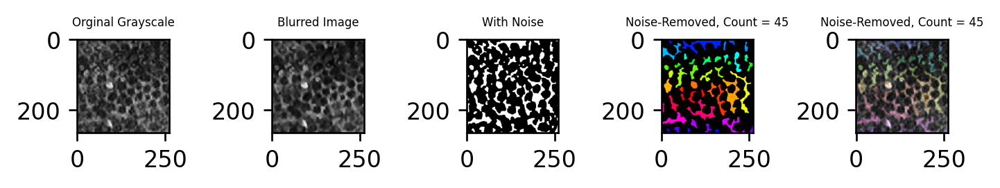

117718Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 13.249840123871095 30.379123097515986
Block size from formula: 40.64029099196811
Blocksize, iterations: 41, 2
21
Size variation: 0.8575184893478874
Distribution: 1.5646829751841407
Overall score: 1.2111007322660141

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


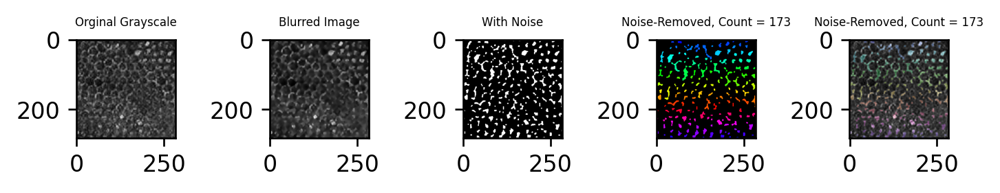

135193Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 9.016132104140599 31.662067731916057
Block size from formula: 47.22611334277026
Blocksize, iterations: 47, 3
23
Size variation: 0.49431553784369536
Distribution: 3.4778740739859764
Overall score: 1.9860948059148358

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


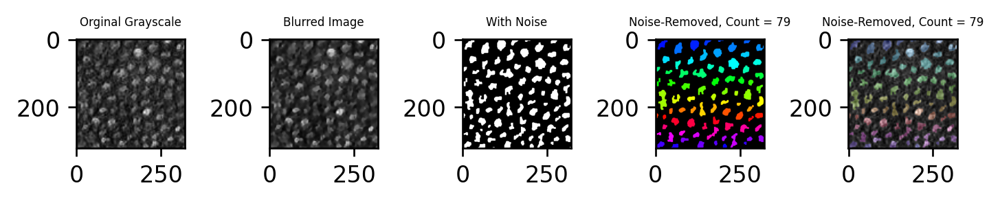

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135185Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 8.1633964756757 27.582788152837875
Block size from formula: 39.809627121655055
Blocksize, iterations: 39, 2
19
Size variation: 0.7354619521117024
Distribution: 2.367758220182329
Overall score: 1.5516100861470157

Original image passed all tests; did not need to check inverted.


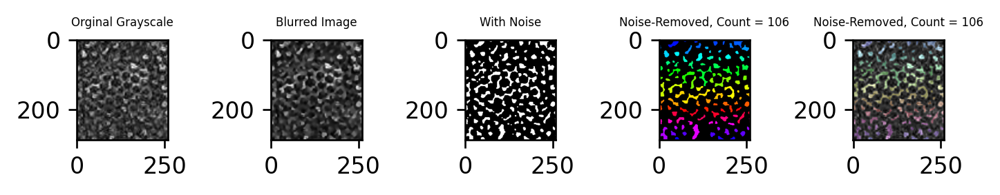

117718Ventral-NoFlash-2.png
Original Image:
avg shortest distance 13.380421476660944 35.01454827338135
Block size from formula: 58.84121653089623
Blocksize, iterations: 57, 3
29
Size variation: 0.5641344585671331
Distribution: 7.247855440813822
Overall score: 3.9059949496904776

Inverted Image:
avg shortest distance 17.748896522940086 56.73685542662157
Block size from formula: 133.26709160665564
Blocksize, iterations: 127, 3
63
Size variation: 0.943253667450475
Distribution: 29.025710582009783
Overall score: 14.984482124730128

Tried both original and inverted, but decided to keep original.


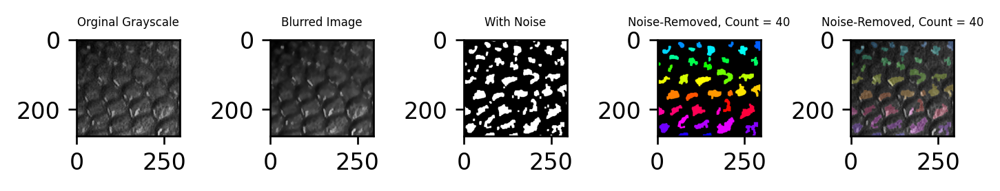

117718Ventral-NoFlash-3.png
Original Image:
avg shortest distance 17.322816424553512 32.7945407364813
Block size from formula: 47.023020375656166
Blocksize, iterations: 47, 3
23
Size variation: 0.6649714427319113
Distribution: 3.6863410116731776
Overall score: 2.1756562272025444

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


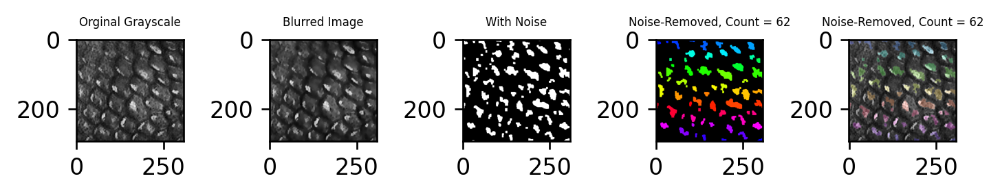

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135193Ventral-NoFlash-4.png
Original Image:
avg shortest distance 6.274668021159677 35.47808831374909
Block size from formula: 65.44735513747233
Blocksize, iterations: 63, 4
31
Size variation: 0.5489817813913653
Distribution: 4.870420659447379
Overall score: 2.709701220419372

Original image passed all tests; did not need to check inverted.


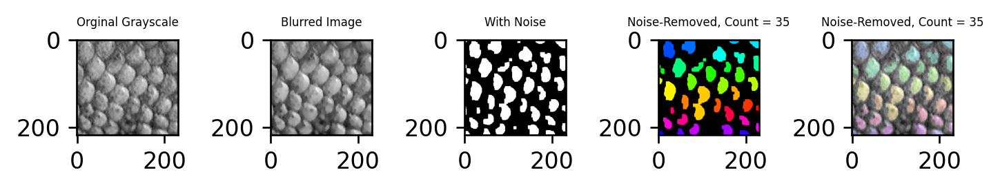

117716Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 7.785375272816095 26.76979562810775
Block size from formula: 40.66380809100405
Blocksize, iterations: 39, 2
19
Size variation: 0.6837024866505651
Distribution: 1.9714928617135083
Overall score: 1.3275976741820368

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


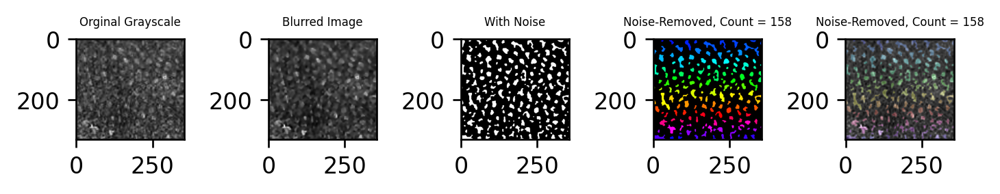

135185Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 6.426514797147772 23.689586307316034
Block size from formula: 37.20452226024256
Blocksize, iterations: 37, 2
19
Size variation: 100
Distribution: 5.961990530851705
Overall score: 52.980995265425854

Inverted Image:
avg shortest distance 5.61525675230047 29.131986674430326
Block size from formula: 57.544758717416656
Blocksize, iterations: 55, 3
27
Size variation: 100
Distribution: 4.520574583817018
Overall score: 52.26028729190851
Could not find 1 subimages that pass the quality check.

DECIDED TO USE INVERTED IMAGE.


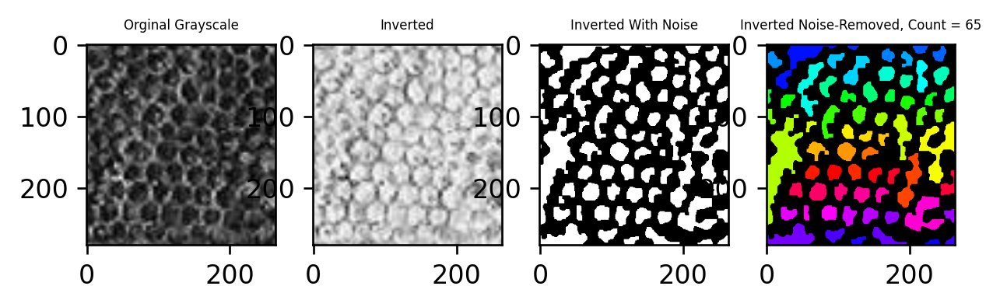

117718Ventral-NoFlash-1.png
Original Image:
avg shortest distance 14.282575528169295 35.62462555401861
Block size from formula: 75.34177342338342
Blocksize, iterations: 71, 4
35
Size variation: 0.8028788671456983
Distribution: 6.8530423795951085
Overall score: 3.8279606233704033

Inverted Image:
avg shortest distance 23.60190990636224 34.403934671434655
Block size from formula: 112.0110808190036
Blocksize, iterations: 105, 3
53
Size variation: 1.0058658037592119
Distribution: 30.264365397570636
Overall score: 15.635115600664923

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


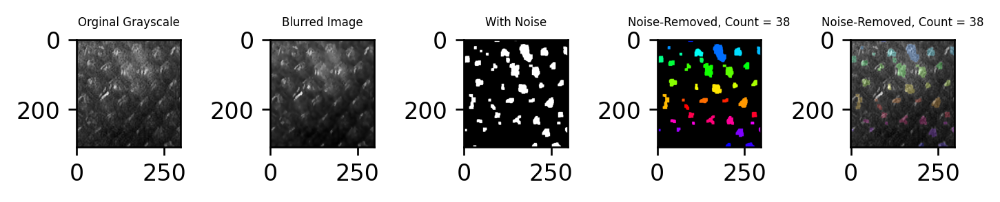

117716Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 5.704996376358651 27.320751664337138
Block size from formula: 46.19573675142152
Blocksize, iterations: 45, 3
23
Size variation: 0.5914329511898143
Distribution: 2.1668887440893827
Overall score: 1.3791608476395985

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


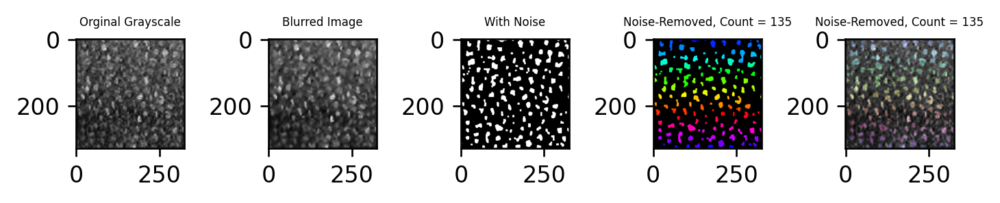

135182Dorsal-NoFlash-1.png
Original Image:
avg shortest distance 10.12826632679145 29.6867927938428
Block size from formula: 39.9789265638657
Blocksize, iterations: 39, 2
19
Size variation: 0.5825113593411169
Distribution: 1.9224408164004205
Overall score: 1.2524760878707686

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


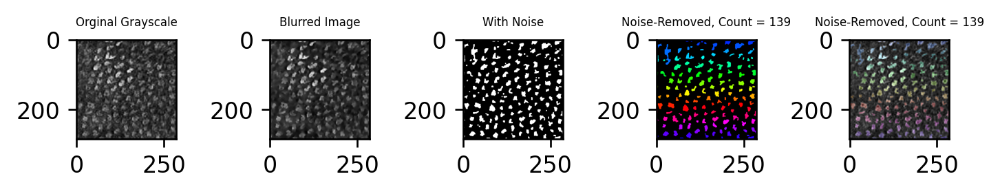

135193Ventral-NoFlash-3.png
Original Image:
avg shortest distance 6.180507956312915 38.75539583175189
Block size from formula: 70.7384593028575
Blocksize, iterations: 69, 4
35
Size variation: 0.47628585929767187
Distribution: 6.101499535706691
Overall score: 3.2888926975021815

Inverted Image:
avg shortest distance 14.864058101665758 39.07510514989877
Block size from formula: 81.0200618675712
Blocksize, iterations: 77, 4
39

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


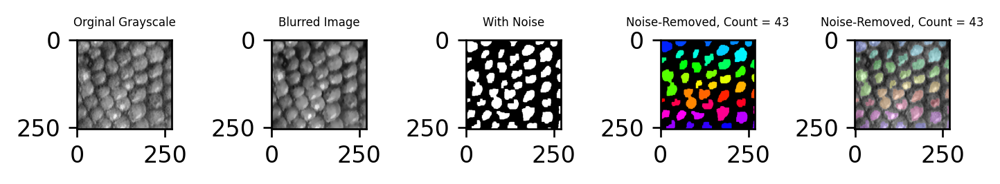

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135196Ventral-NoFlash-2.png
Original Image:
avg shortest distance 3.6066741362395898 25.775710469706198
Block size from formula: 44.02912538790293
Blocksize, iterations: 43, 2
21
Size variation: 0.4350027442240381
Distribution: 3.8525089121565683
Overall score: 2.143755828190303

Original image passed all tests; did not need to check inverted.


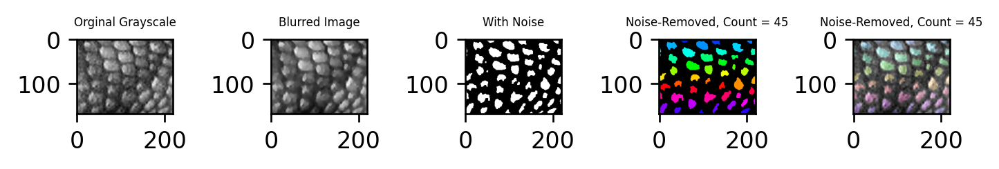

135196Ventral-NoFlash-3.png
Original Image:
avg shortest distance 9.538577553580854 36.05380331003324
Block size from formula: 68.91271656268988
Blocksize, iterations: 67, 4
33
Size variation: 0.4501893258283383
Distribution: 5.682905521586057
Overall score: 3.0665474237071977

Inverted Image:
avg shortest distance 20.796789642108926 33.620556792417865
Block size from formula: 70.81100004031032
Blocksize, iterations: 67, 4
33

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


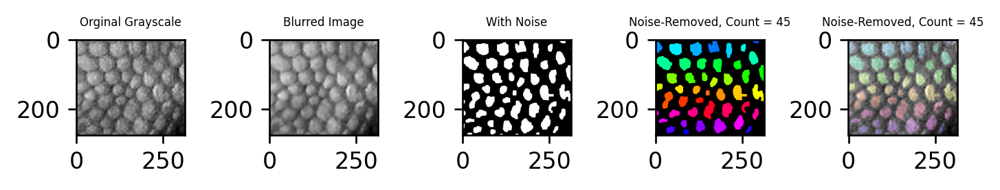

135193Ventral-NoFlash-2.png
Original Image:
avg shortest distance 7.672920244849699 30.396660120835588
Block size from formula: 56.08855864398154
Blocksize, iterations: 55, 3
27
Size variation: 0.32798841786112704
Distribution: 5.990486572765192
Overall score: 3.15923749531316

Inverted Image:
avg shortest distance 10.8748332590789 31.241947674683406
Block size from formula: 55.380438768343126
Blocksize, iterations: 53, 3
27
Size variation: 100
Distribution: 12.111708813968601
Overall score: 56.0558544069843

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


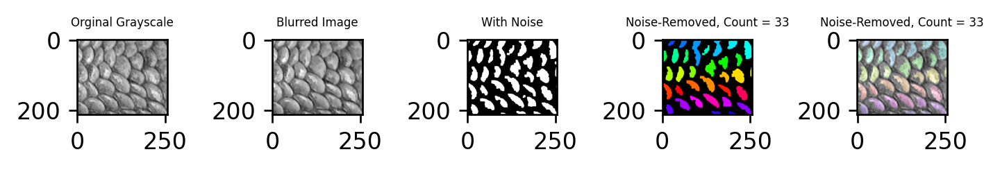

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135182Dorsal-NoFlash-2.png
Original Image:
avg shortest distance 7.727460415518594 24.623331726132236
Block size from formula: 34.08178634535521
Blocksize, iterations: 33, 2
17
Size variation: 0.4554080793118237
Distribution: 1.6123439654421117
Overall score: 1.0338760223769676

Original image passed all tests; did not need to check inverted.


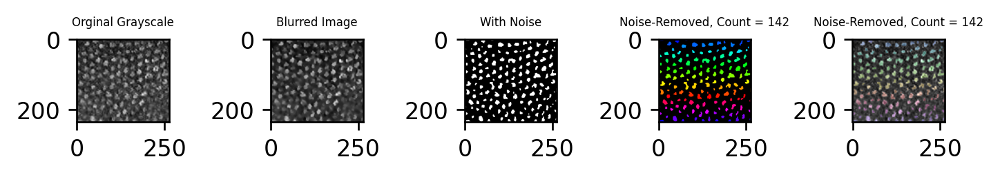

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135196Ventral-NoFlash-1.png
Original Image:
avg shortest distance 7.893998048265363 33.91740770616544
Block size from formula: 61.120463931193605
Blocksize, iterations: 59, 3
29
Size variation: 0.38102454936541996
Distribution: 4.886648467087051
Overall score: 2.6338365082262354

Original image passed all tests; did not need to check inverted.


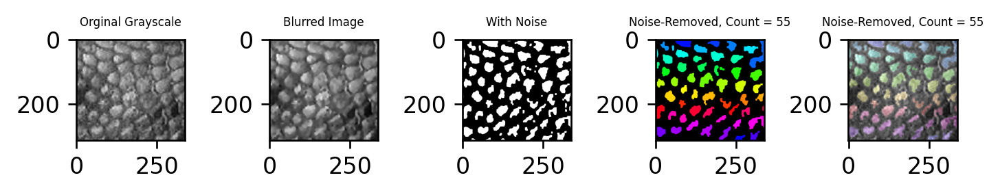

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135182Dorsal-NoFlash-3.png
Original Image:
avg shortest distance 10.807836736185525 27.9549647196595
Block size from formula: 39.8796813402991
Blocksize, iterations: 39, 2
19
Size variation: 0.5439454849835964
Distribution: 2.51813332515094
Overall score: 1.5310394050672682

Original image passed all tests; did not need to check inverted.


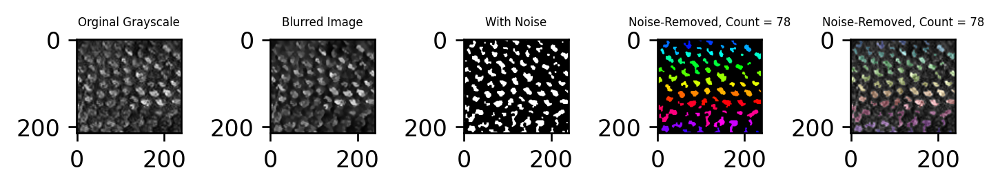

135193Ventral-NoFlash-1.png
Original Image:
avg shortest distance 6.407968592792382 36.35859066575229
Block size from formula: 67.4273726731426
Blocksize, iterations: 65, 4
33
Size variation: 0.36051193144097105
Distribution: 6.1227454065717435
Overall score: 3.2416286690063574

Inverted Image:
avg shortest distance 11.468354236631585 30.06885095719062
Block size from formula: 55.78318251775106
Blocksize, iterations: 53, 3
27
Size variation: 100
Distribution: 13.200520709980555
Overall score: 56.600260354990276

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


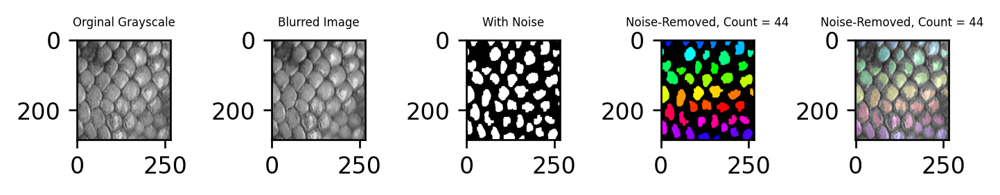

135182Ventral-NoFlash-3.png
Original Image:
avg shortest distance 5.119289241387328 26.2532327657639
Block size from formula: 49.015784120346076
Blocksize, iterations: 47, 3
23
Size variation: 0.3284349624160594
Distribution: 5.61306521689286
Overall score: 2.9707500896544596

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


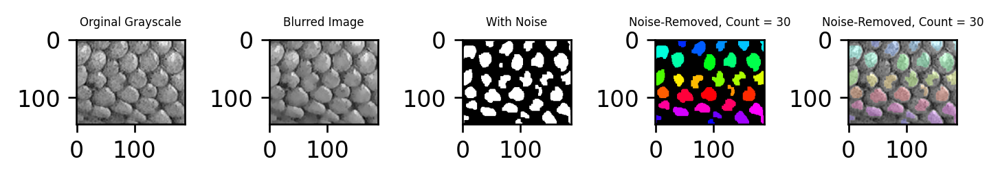

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135182Ventral-NoFlash-2.png
Original Image:
avg shortest distance 5.768074353615344 30.861101920006572
Block size from formula: 57.084485728031574
Blocksize, iterations: 55, 3
27
Size variation: 0.29700540119936475
Distribution: 3.3774791862592624
Overall score: 1.8372422937293136

Original image passed all tests; did not need to check inverted.


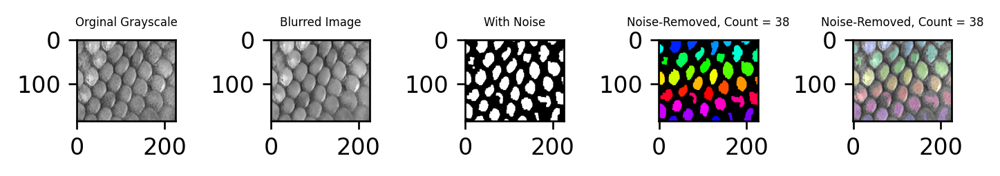

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


135182Ventral-NoFlash-1.png
Original Image:
avg shortest distance 5.5243948776979535 28.319537807381945
Block size from formula: 54.46771305200801
Blocksize, iterations: 53, 3
27
Size variation: 0.43715949732801
Distribution: 3.9954574958143114
Overall score: 2.216308496571161

Original image passed all tests; did not need to check inverted.


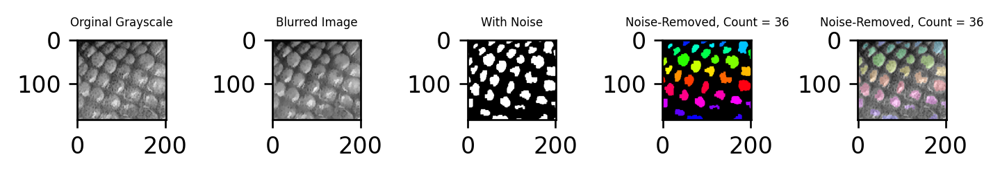

117702Ventral-NoFlash-2.png
Original Image:
avg shortest distance 15.653470608679365 46.522526573661274
Block size from formula: 76.44841672827762
Blocksize, iterations: 73, 4
37
Size variation: 0.41484374329401913
Distribution: 9.358301165295643
Overall score: 4.886572454294831

Inverted Image:
avg shortest distance 68.66941673879941 81.95166213699872
Block size from formula: 273.0803017525556
Blocksize, iterations: 257, 3
129
Size variation: 1.6934231145193313
Distribution: 48.777093741282116
Overall score: 25.235258427900725

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


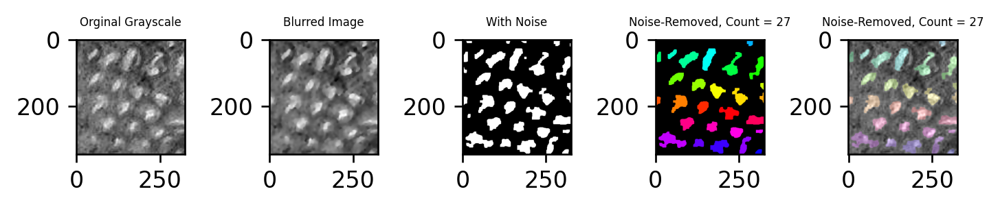

117702Ventral-NoFlash-3.png
Original Image:
avg shortest distance 18.690475828704674 46.1039572410709
Block size from formula: 141.3896572267696
Blocksize, iterations: 133, 3
67

Inverted Image:
avg shortest distance 14.159404392817935 47.85168697642438
Block size from formula: 87.80904579050413
Blocksize, iterations: 85, 4
43
Size variation: 0.662670648919821
Distribution: 9.177462371647552
Overall score: 4.920066510283687

DECIDED TO USE INVERTED IMAGE.


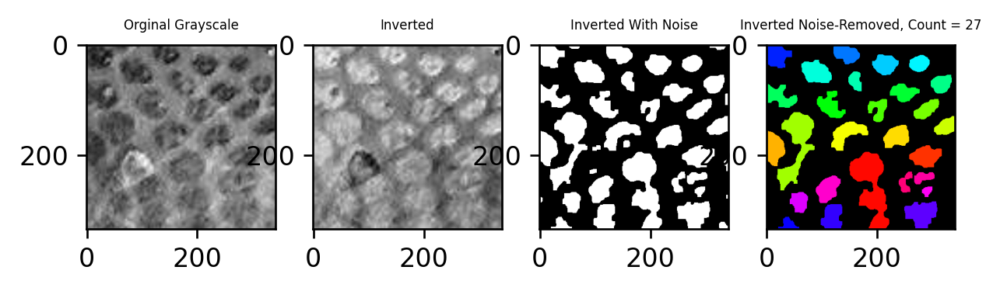

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


117702Ventral-NoFlash-1.png
Original Image:
avg shortest distance 15.041374065814939 39.73656333584886
Block size from formula: 72.6984421473069
Blocksize, iterations: 71, 4
35
Size variation: 0.6937945995190098
Distribution: 6.975490416145925
Overall score: 3.8346425078324673

Inverted Image:
avg shortest distance 29.96183675967559 51.611559832297516
Block size from formula: 117.7271958472555
Blocksize, iterations: 113, 3
57

Tried both original and inverted, but decided to keep original.


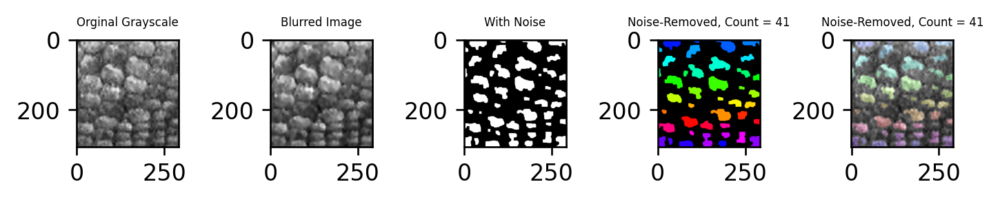

117702Ventral-NoFlash-4.png
Original Image:
avg shortest distance 20.596900834671942 43.37731330456424
Block size from formula: 95.19134916509327
Blocksize, iterations: 91, 3
45
Size variation: 0.40360494010979514
Distribution: 10.241542496656583
Overall score: 5.32257371838319

Inverted Image:
avg shortest distance 20.21607197136686 48.59941098615551
Block size from formula: 94.6907485840924
Blocksize, iterations: 91, 3
45
Size variation: 1.037064576582924
Distribution: 48.46292013797418
Overall score: 24.74999235727855
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


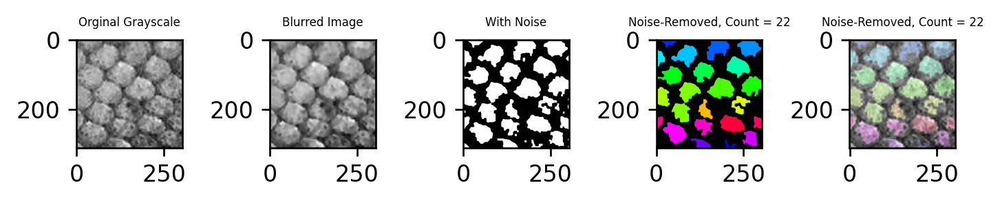

In [202]:
run_count_on_directory('Guanica_County_images/')

Screenshot 2021-04-19 at 5.13.34 PM.png
Original Image:
avg shortest distance 10.604198273981378 41.05268063736609
Block size from formula: 69.77851580153445
Blocksize, iterations: 67, 4
33
Size variation: 0.38258548597652586
Distribution: 7.167060392873825
Overall score: 3.7748229394251753

Inverted Image:
avg shortest distance 111.83735266084831 84.07630025705717
Block size from formula: 416.1757347694253
Blocksize, iterations: 387, 3
193

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


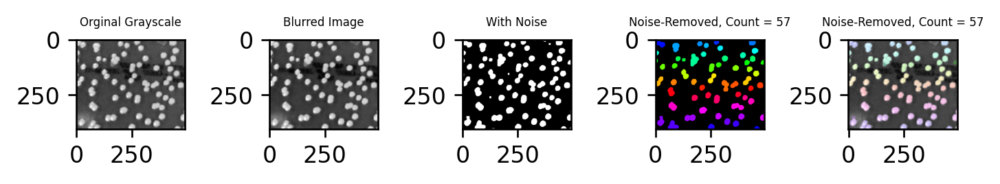

Screenshot 2021-04-19 at 5.03.29 PM.png
Original Image:
avg shortest distance 27.346809810621604 42.10751344137007
Block size from formula: 105.79286877533993
Blocksize, iterations: 101, 3
51
Size variation: 100
Distribution: 9.505775673198395
Overall score: 54.7528878365992

Inverted Image:
avg shortest distance 88.18039519678348 95.61218802763416
Block size from formula: 262.4822096318352
Blocksize, iterations: 247, 3
123
Size variation: 1.8132671072648672
Distribution: 175.02617507224215
Overall score: 88.41972108975351
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


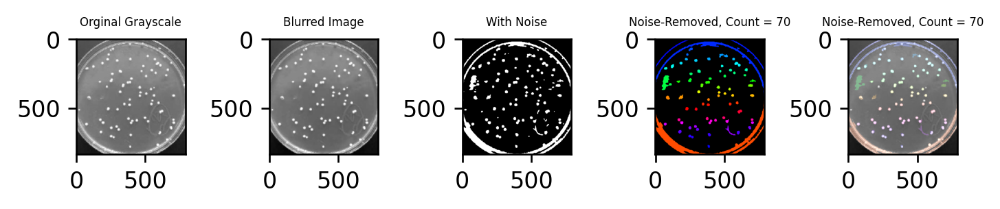

Screenshot 2021-04-19 at 5.03.37 PM.png
Original Image:
avg shortest distance 21.692342273435457 55.6608483826721
Block size from formula: 98.67809685475837
Blocksize, iterations: 95, 3
47
Size variation: 100
Distribution: 7.422619544212944
Overall score: 53.711309772106475

Inverted Image:
avg shortest distance 152.0601129194562 191.18823773567746
Block size from formula: 500.69479342456776
Blocksize, iterations: 473, 3
237
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


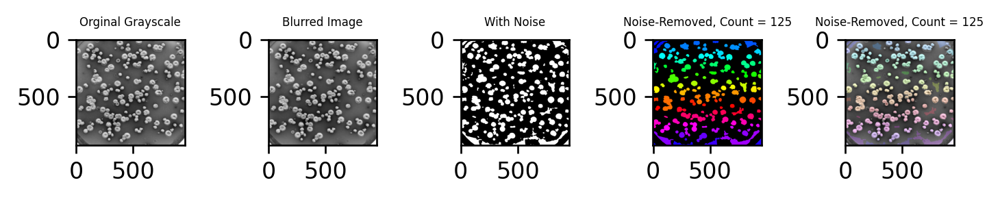

Screenshot 2021-04-19 at 5.13.43 PM.png
Original Image:
avg shortest distance 12.382778364649075 42.02501915807778
Block size from formula: 79.28201837425335
Blocksize, iterations: 77, 4
39
Size variation: 0.9003230384044845
Distribution: 6.545319820192075
Overall score: 3.7228214292982797

Inverted Image:
avg shortest distance 50.74649375264438 68.31874981842137
Block size from formula: 210.85559123807622
Blocksize, iterations: 199, 3
99

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


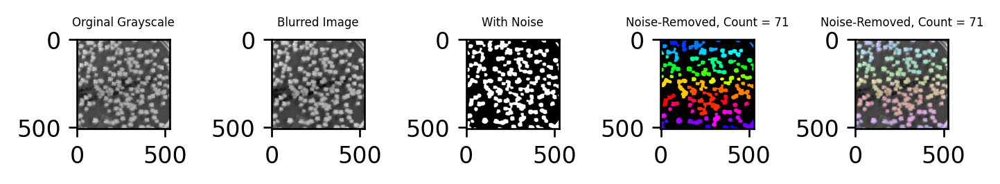

Screenshot 2021-04-19 at 5.12.45 PM.png
Original Image:
avg shortest distance 47.87366832500713 95.69053287941746
Block size from formula: 202.47280400753553
Blocksize, iterations: 193, 3
97
Size variation: 100
Distribution: 26.958815384236328
Overall score: 63.479407692118166

Inverted Image:
avg shortest distance 112.74777503523741 114.07264971682147
Block size from formula: 410.7680872363166
Blocksize, iterations: 385, 3
193
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


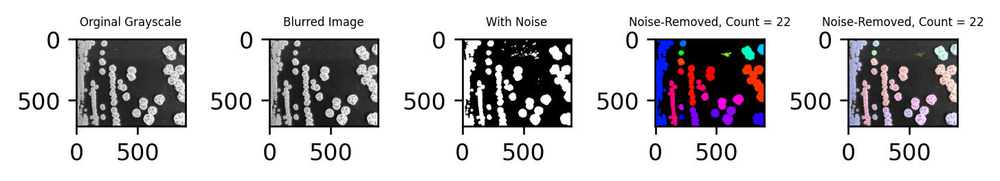

Screenshot 2021-04-19 at 5.13.30 PM.png
Original Image:
avg shortest distance 16.77948504307268 53.21945987775478
Block size from formula: 86.20253747080997
Blocksize, iterations: 83, 4
41
Size variation: 0.3819656435023188
Distribution: 11.683022589412852
Overall score: 6.032494116457586

Inverted Image:
avg shortest distance 0.0 16.431133741764647
Block size from formula: 535.5783047005367
Blocksize, iterations: 491, 3
245
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


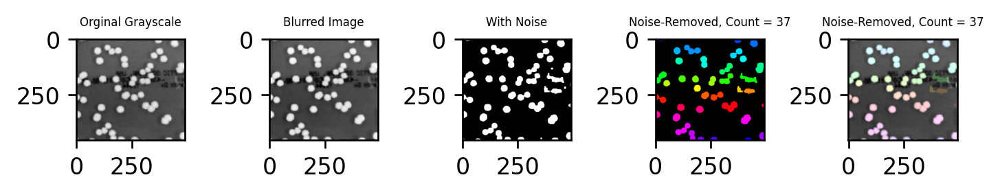

Screenshot 2021-04-19 at 5.13.39 PM.png
Original Image:
avg shortest distance 16.57524821974465 43.90195352519398
Block size from formula: 81.6096024446582
Blocksize, iterations: 79, 4
39
Size variation: 100
Distribution: 10.322003534037808
Overall score: 55.1610017670189

Inverted Image:
avg shortest distance 60.47421690796531 69.335549885115
Block size from formula: 253.59326484467258
Blocksize, iterations: 237, 3
119
Size variation: 1.6640860943840856
Distribution: 156.58445844185331
Overall score: 79.1242722681187
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


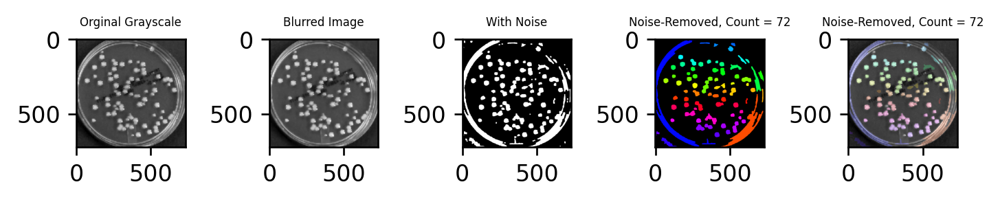

Screenshot 2021-04-19 at 5.13.13 PM.png
Original Image:
avg shortest distance 38.36268027655714 87.7728891388586
Block size from formula: 185.12642344936967
Blocksize, iterations: 177, 3
89
Size variation: 100
Distribution: 21.685789844426616
Overall score: 60.842894922213304

Inverted Image:
avg shortest distance 62.563393810614805 129.21808158279805
Block size from formula: 387.03725365148176
Blocksize, iterations: 365, 3
183
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


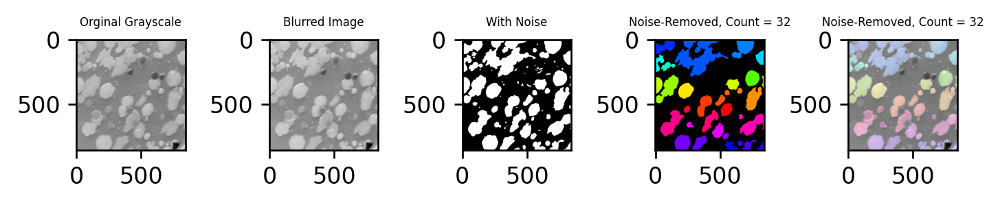

Screenshot 2021-04-19 at 5.03.43 PM.png
Original Image:
avg shortest distance 21.627251396138607 39.26226336122524
Block size from formula: 48.69753728409497
Blocksize, iterations: 49, 3
25
Size variation: 0.5564076245306976
Distribution: 2.4217150503668385
Overall score: 1.489061337448768

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


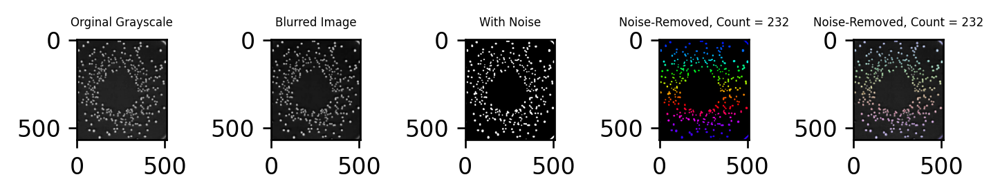

In [203]:
directory = 'sample_bacteria_colonies/'

run_count_on_directory(directory)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


SUBIMAGE #0:

Original Image:
avg shortest distance 6.018653834944034 28.677387084872258
Block size from formula: 48.661871983529835
Blocksize, iterations: 47, 3
23
Size variation: 0.5390093342500186
Distribution: 4.478048355207224
Overall score: 2.5085288447286214

Original image passed all tests; did not need to check inverted.


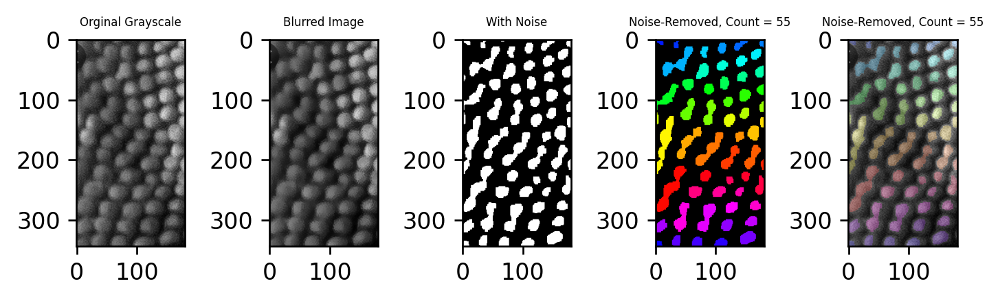

SUBIMAGE #1:

Original Image:
avg shortest distance 7.1327246503800925 28.983851485523804
Block size from formula: 59.04326805842827
Blocksize, iterations: 57, 3
29
Size variation: 0.5344712432264132
Distribution: 4.837374574659292
Overall score: 2.6859229089428527

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


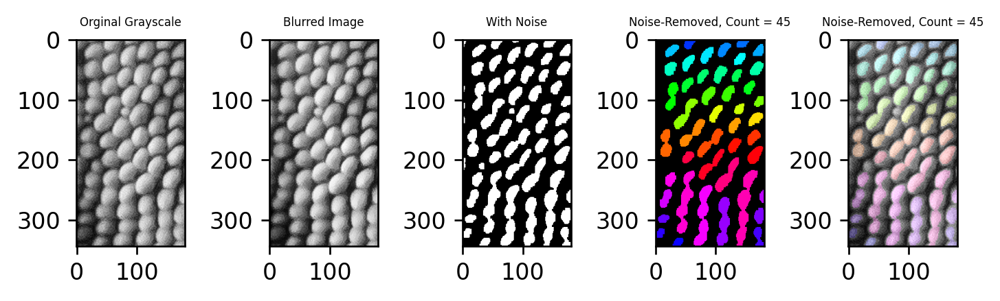

SUBIMAGE #2:

Original Image:
avg shortest distance 5.397243277238572 28.176007833086906
Block size from formula: 52.77767212091985
Blocksize, iterations: 51, 3
25
Size variation: 0.4944828690093156
Distribution: 3.4093967888651777
Overall score: 1.9519398289372467

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


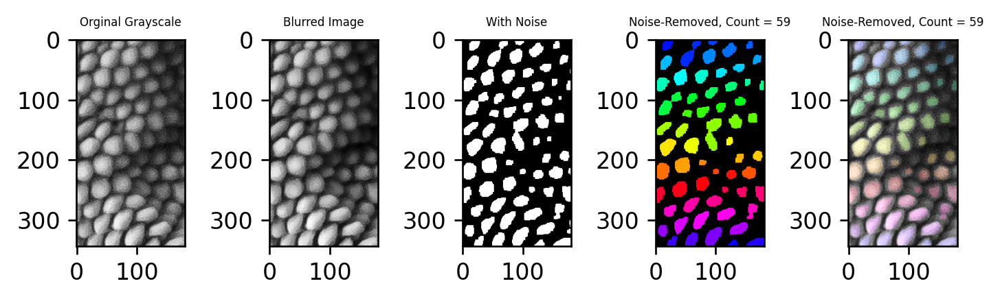

SUBIMAGE #3:

Original Image:
avg shortest distance 8.148319595208449 29.800637470860536
Block size from formula: 55.71319095054427
Blocksize, iterations: 53, 3
27
Size variation: 0.6631781006090732
Distribution: 4.365245551776267
Overall score: 2.5142118261926703

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


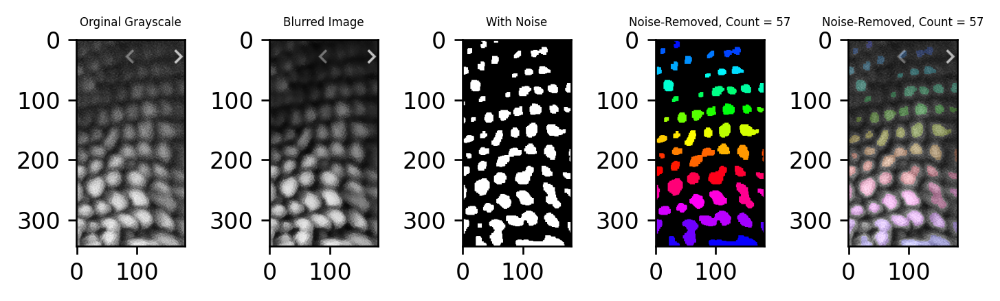

SUBIMAGE #4:

Original Image:
avg shortest distance 4.269122268911492 26.11436886652131
Block size from formula: 46.36639347064174
Blocksize, iterations: 45, 3
23
Size variation: 0.33163626706238736
Distribution: 2.672902777685727
Overall score: 1.5022695223740572

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


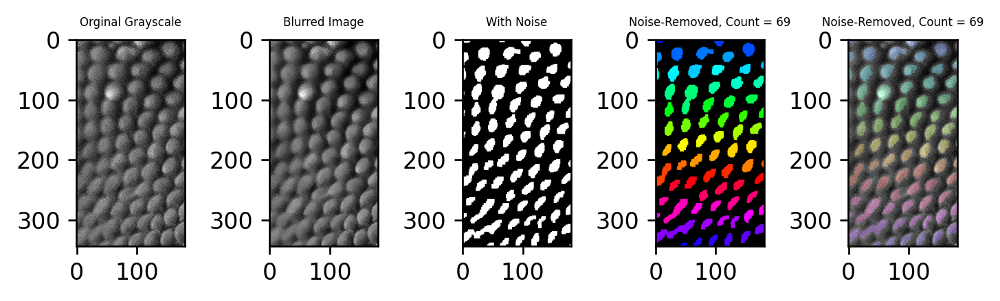

SUBIMAGE #5:

Original Image:
avg shortest distance 6.652328537410815 24.962179493953627
Block size from formula: 43.17599944360195
Blocksize, iterations: 41, 2
21
Size variation: 0.25338361921130276
Distribution: 2.785568640402413
Overall score: 1.5194761298068578

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


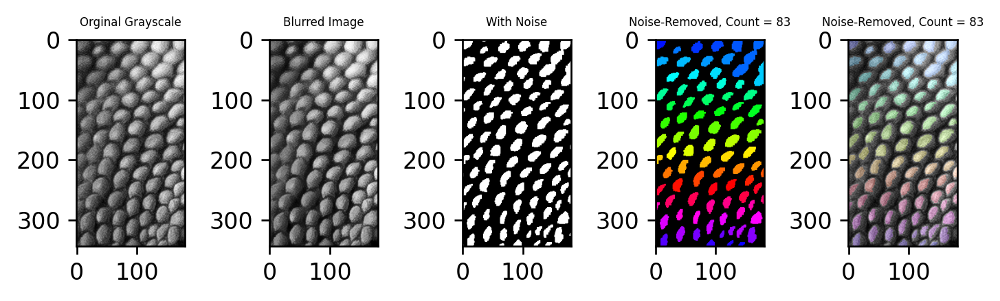

SUBIMAGE #6:

Original Image:
avg shortest distance 6.671327602954799 25.464465631106023
Block size from formula: 48.910747916850056
Blocksize, iterations: 47, 3
23
Size variation: 100
Distribution: 3.8529781521553046
Overall score: 51.92648907607765

Inverted Image:
avg shortest distance 7.3983372806677865 29.231861979510384
Block size from formula: 53.17114481515921
Blocksize, iterations: 51, 3
25
Size variation: 100
Distribution: 7.663654699138181
Overall score: 53.83182734956909
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


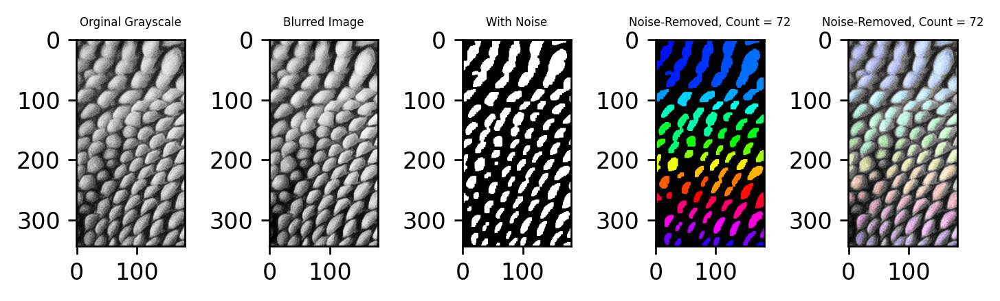

SUBIMAGE #7:

Original Image:
avg shortest distance 7.538588526530513 25.682622647583663
Block size from formula: 50.41370505487195
Blocksize, iterations: 49, 3
25
Size variation: 0.5605772053672049
Distribution: 3.5107329167279495
Overall score: 2.035655061047577

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


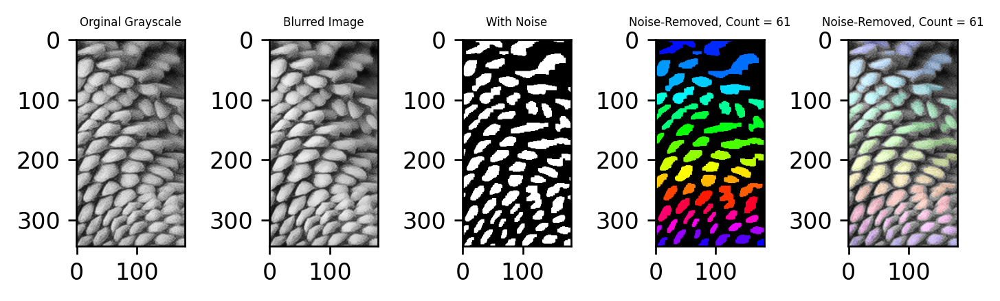

SUBIMAGE #8:

Original Image:
avg shortest distance 5.114094915938896 25.305823712981535
Block size from formula: 45.36128878693624
Blocksize, iterations: 43, 2
21
Size variation: 0.30414067860418414
Distribution: 2.5976975827315174
Overall score: 1.4509191306678508

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


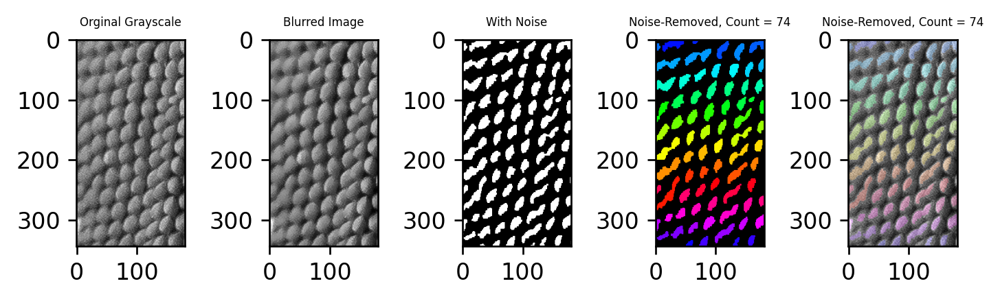

SUBIMAGE #9:

Original Image:
avg shortest distance 4.074224905225901 22.50427706349014
Block size from formula: 37.50177932104197
Blocksize, iterations: 37, 2
19
Size variation: 0.4751245181603702
Distribution: 2.5851165213931835
Overall score: 1.5301205197767769

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


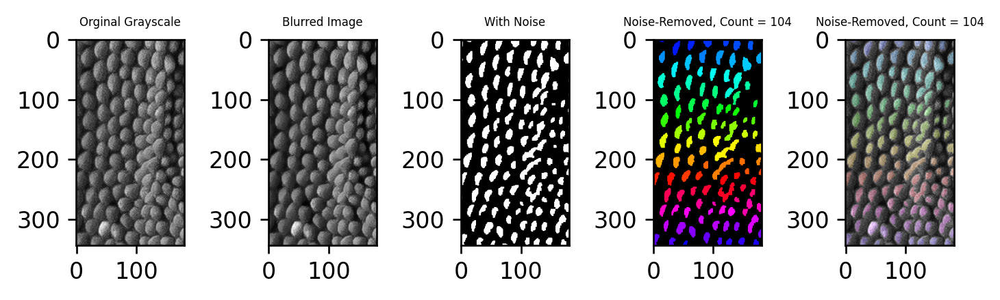

SUBIMAGE #10:

Original Image:
avg shortest distance 4.577429582581275 21.53923929321641
Block size from formula: 37.34880935720148
Blocksize, iterations: 37, 2
19
Size variation: 100
Distribution: 2.3270165386249086
Overall score: 51.16350826931245

Inverted Image:
avg shortest distance 7.615208796300689 23.455658876371494
Block size from formula: 42.03342080376872
Blocksize, iterations: 41, 2
21
Size variation: 100
Distribution: 5.811339581108614
Overall score: 52.905669790554306
Could not find 1 subimages that pass the quality check.

Tried both original and inverted, but decided to keep original.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


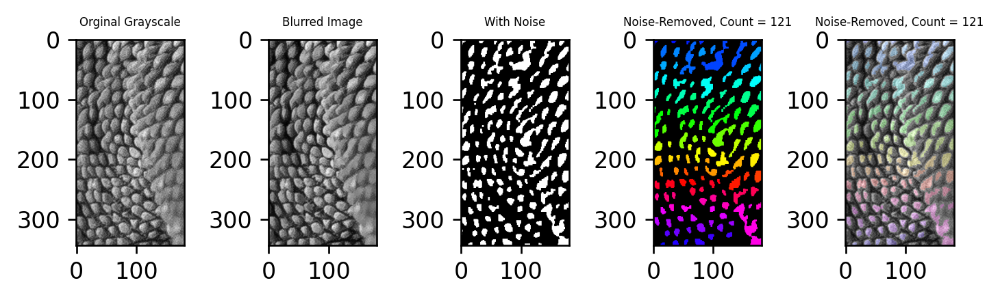

SUBIMAGE #11:

Original Image:
avg shortest distance 6.507668925551118 25.62221260862585
Block size from formula: 43.586754031603036
Blocksize, iterations: 43, 2
21
Size variation: 0.5515782100510316
Distribution: 3.3978339811096445
Overall score: 1.9747060955803382

Original image passed all tests; did not need to check inverted.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


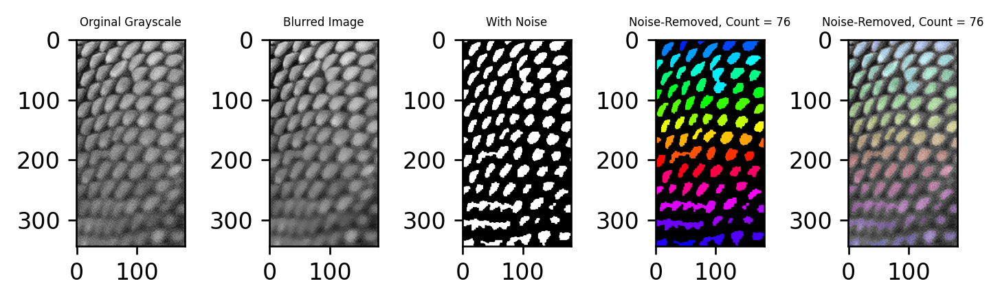

ESTIMATED TOTAL COUNT: 753.3333333333334 SCALES

_______________________________________________

SELECTED SUBIMAGES: [4, 5, 8]


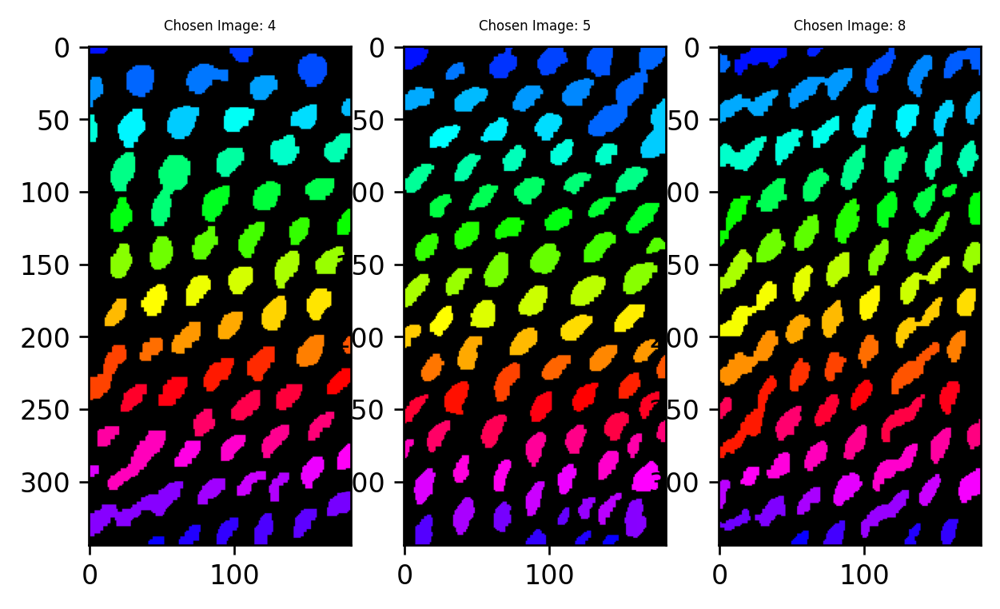

In [204]:
split_count_select('small/small2.png', 10, 3)